# SAM 2 Real-Time: Processing Long Videos (2000+ Frames)

This notebook demonstrates how to process long videos using SAM2's real-time camera predictor without chunking.

## Why This Approach?
- **Original SAM2 issue**: The standard video predictor loads all frames into memory, causing OOM errors for long videos
- **Real-time solution**: Processes frames sequentially, maintaining only a memory bank of recent frames
- **Memory efficient**: Uses streaming approach instead of loading entire video

## Model Selection for Memory Efficiency
- **Tiny (Recommended)**: `sam2.1_hiera_t.yaml` - Lowest memory usage, fastest inference
- **Tiny 512**: `sam2.1_hiera_t_512.yaml` - Even lower memory (512x512 resolution)
- **Small**: `sam2.1_hiera_s.yaml` - Better accuracy but 2-3x more memory

For 2000 frames with limited memory, **use Tiny or Tiny 512**.

## 1. Setup and Imports

Import necessary libraries and configure PyTorch for optimal performance.

In [1]:
import os
import sys
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from pathlib import Path

# Add sam2 to path if needed
sys.path.append(os.path.abspath('.'))

from sam2.build_sam import build_sam2_camera_predictor

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

PyTorch version: 2.9.1+cu128
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3060
CUDA memory: 12.49 GB


## 2. Configure PyTorch for Memory Efficiency

Enable optimizations:
- **bfloat16**: Reduces memory usage by ~50% compared to float32
- **tf32**: Faster computation on Ampere+ GPUs (RTX 30xx, A100, etc.)
- **Empty cache**: Clear any residual GPU memory

In [2]:
# Clear GPU cache
torch.cuda.empty_cache()

# Enable automatic mixed precision with bfloat16
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

# Enable TF32 for Ampere GPUs (faster computation)
if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    print("✓ TF32 enabled for Ampere+ GPU")
else:
    print("ℹ TF32 not available (requires Ampere+ GPU)")

print("✓ PyTorch configured for memory efficiency")

✓ TF32 enabled for Ampere+ GPU
✓ PyTorch configured for memory efficiency


## 3. Configuration Parameters

Set your video path and model configuration.

### Model Options:
- **For maximum memory savings**: Use `sam2.1_hiera_t_512` (512x512 resolution)
- **For balance**: Use `sam2.1_hiera_t` (1024x1024 resolution)
- **vos_optimized**: Enables model compilation for faster inference after warmup

In [3]:
# ============= CONFIGURATION =============

# Input: Video data folder containing video file and annotation JSON
INPUT_FOLDER = "/home/multi-gpu/ai_res/Hira/segment-anything-2-real-time/data/task_694b8738c03ba603fd332970_export"

print(f"Input folder: {INPUT_FOLDER}")

# Auto-detect video and annotation files in the folder
import glob

# Find JSON annotation file
json_files = glob.glob(os.path.join(INPUT_FOLDER, "*.json"))
if len(json_files) == 0:
    raise ValueError(f"No JSON annotation file found in {INPUT_FOLDER}")
elif len(json_files) > 1:
    print(f"⚠ Multiple JSON files found: {json_files}")
    print(f"  Using first one: {json_files[0]}")

ANNOTATION_FILE = json_files[0]
print(f"✓ Found annotation: {os.path.basename(ANNOTATION_FILE)}")

# Find ANY video file in the folder (simpler approach)
video_extensions = ['*.mp4', '*.avi', '*.mov', '*.mkv']
video_files = []

for ext in video_extensions:
    video_files.extend(glob.glob(os.path.join(INPUT_FOLDER, ext)))

if len(video_files) == 0:
    raise ValueError(f"No video file found in {INPUT_FOLDER}\nSearched for extensions: .mp4, .avi, .mov, .mkv")
elif len(video_files) > 1:
    print(f"⚠ Multiple video files found: {[os.path.basename(f) for f in video_files]}")
    print(f"  Using first one: {os.path.basename(video_files[0])}")

VIDEO_PATH = video_files[0]
print(f"✓ Found video: {os.path.basename(VIDEO_PATH)}")

# Model configuration - Choose one:
# Option 1: Tiny 512 (LOWEST MEMORY - Recommended for 2000+ frames)
MODEL_CFG = "configs/sam2.1/sam2.1_hiera_t_512.yaml"
CHECKPOINT = "checkpoints/sam2.1_hiera_tiny.pt"

# Option 2: Tiny 1024 (Low memory, better quality)
# MODEL_CFG = "configs/sam2.1/sam2.1_hiera_t.yaml"
# CHECKPOINT = "checkpoints/sam2.1_hiera_tiny.pt"

# Option 3: Small (More memory, best quality)
# MODEL_CFG = "configs/sam2.1/sam2.1_hiera_s.yaml"
# CHECKPOINT = "checkpoints/sam2.1_hiera_small.pt"

# Output configuration - mirror input folder structure
folder_name = os.path.basename(INPUT_FOLDER.rstrip('/'))
OUTPUT_DIR = folder_name  # Save directly to folder with same name as input
SAVE_MASKS = True  # Save individual masks per frame
SAVE_RAW_VIDEO = True  # Copy original video to raw/ subfolder
SAVE_MASKS_ONLY_VIDEO = True  # Save binary masks video (black background)
SAVE_OVERLAY_VIDEO = True  # Save video with mask overlays
VISUALIZATION_INTERVAL = 100  # Show preview every N frames

# Performance optimization
VOS_OPTIMIZED = True  # Enable model compilation (faster after warmup)

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"\n✓ Configuration set")
print(f"  Model: {MODEL_CFG}")
print(f"  Output folder: {OUTPUT_DIR}")


Input folder: /home/multi-gpu/ai_res/Hira/segment-anything-2-real-time/data/task_694b8738c03ba603fd332970_export
✓ Found annotation: 24-DEC-25-10:42:11:AM_2.avi (trim 1)_annotations.json
✓ Found video: 24-DEC-25-10:42:11:AM_2.avi (trim 1)_trimmed.mp4

✓ Configuration set
  Model: configs/sam2.1/sam2.1_hiera_t_512.yaml
  Output folder: task_694b8738c03ba603fd332970_export


### 🔍 Understanding the "512" Resolution

**Important**: The "512" refers to SAM2's **internal processing resolution**, NOT your input video resolution!

#### How it works:
1. **Your video**: Can be ANY resolution (e.g., 1920x1080, 3840x2160, 640x480, etc.)
2. **SAM2 internally**: Resizes frames to 512x512 (or 1024x1024) for processing
3. **Output masks**: Automatically scaled back to your original video resolution

#### Example:
- Your video: 1920x1080 (Full HD)
- Using `sam2.1_hiera_t_512.yaml`
- SAM2 process:
  - Takes your 1920x1080 frame
  - Internally resizes to 512x512 for processing (saves memory!)
  - Produces mask at 512x512
  - Scales mask back to 1920x1080 for output

#### Memory Impact:
- **512x512 model**: Processes at lower resolution = **LESS memory** (recommended for 2000+ frames)
- **1024x1024 model**: Processes at higher resolution = **MORE memory** but better quality

**Bottom line**: Use 512 for maximum memory savings regardless of your video's actual resolution!

In [4]:
# Check if checkpoint exists
checkpoint_path = CHECKPOINT

if not os.path.exists(checkpoint_path):
    print(f"❌ Checkpoint not found: {checkpoint_path}")
    print("\n📥 Downloading checkpoints...")
    print("This will download all SAM2.1 model checkpoints (~2-3 GB total)\n")
    
    # Create checkpoints directory if it doesn't exist
    os.makedirs("checkpoints", exist_ok=True)
    
    # Run the download script
    import subprocess
    try:
        result = subprocess.run(
            ["bash", "checkpoints/download_ckpts.sh"],
            capture_output=True,
            text=True,
            cwd=os.getcwd()
        )
        
        if result.returncode == 0:
            print("✓ Checkpoints downloaded successfully!")
        else:
            print("⚠ Download script encountered an issue. Please run manually:")
            print("  cd checkpoints")
            print("  bash download_ckpts.sh")
            print("\nOr download directly from:")
            print("  https://github.com/facebookresearch/segment-anything-2/blob/main/checkpoints/download_ckpts.sh")
    except Exception as e:
        print(f"⚠ Could not run download script automatically: {e}")
        print("\n📝 Manual download instructions:")
        print("  1. Open a terminal")
        print("  2. Navigate to: segment-anything-2-real-time/")
        print("  3. Run: cd checkpoints && bash download_ckpts.sh")
        print("\nOr download manually from:")
        print("  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt")
        print("  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt")
        print("  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_base_plus.pt")
        print("  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt")
        print("\nSave them to: checkpoints/")
else:
    print(f"✓ Checkpoint found: {checkpoint_path}")
    checkpoint_size_mb = os.path.getsize(checkpoint_path) / (1024 * 1024)
    print(f"  Size: {checkpoint_size_mb:.1f} MB")

✓ Checkpoint found: checkpoints/sam2.1_hiera_tiny.pt
  Size: 148.8 MB


## 3.5. Download Model Checkpoints (If Not Already Downloaded)

Before loading the model, ensure the checkpoint files are downloaded.

## 4. Load the SAM2 Model

Build the camera predictor with memory-efficient settings.

**Note**: First inference will be slow due to model compilation warmup if `vos_optimized=True`.

In [5]:
print("Loading SAM2 model...")
print("Note: If vos_optimized=True, first inference will be slow (model compilation warmup)\n")

predictor = build_sam2_camera_predictor(
    config_file=MODEL_CFG,
    ckpt_path=CHECKPOINT,
    device="cuda",
    mode="eval",
    vos_optimized=VOS_OPTIMIZED,  # Enable model compilation for speed
)

print("✓ SAM2 model loaded successfully")
print(f"  Device: {predictor.device}")
print(f"  Image size: {predictor.image_size}")
print(f"  Memory frames: {predictor.num_maskmem}")

Loading SAM2 model...
Note: If vos_optimized=True, first inference will be slow (model compilation warmup)

Image encoder compilation is enabled. First forward pass will be slow.
Compiling all components for VOS setting. First time may be very slow.
Compiling memory encoder...
Compiling memory attention...
✓ SAM2 model loaded successfully
  Device: cuda:0
  Image size: 512
  Memory frames: 7


## 5. Open and Inspect Video

Load the video and check its properties.

In [7]:
# Open video
cap = cv2.VideoCapture(VIDEO_PATH)

if not cap.isOpened():
    raise ValueError(f"Cannot open video: {VIDEO_PATH}")

# Get video properties
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("✓ Video opened successfully")
print(f"  Total frames: {total_frames}")
print(f"  FPS: {fps:.2f}")
print(f"  Resolution: {width}x{height}")
print(f"  Duration: {total_frames/fps:.2f} seconds")

# Memory estimation
estimated_memory_gb = (total_frames * width * height * 3) / (1024**3)
print(f"\nℹ Estimated raw video size in memory: {estimated_memory_gb:.2f} GB")
print(f"ℹ SAM2 processes frames sequentially, so peak memory is much lower!")

✓ Video opened successfully
  Total frames: 2411
  FPS: 20.00
  Resolution: 640x480
  Duration: 120.55 seconds

ℹ Estimated raw video size in memory: 2.07 GB
ℹ SAM2 processes frames sequentially, so peak memory is much lower!


## 6. Auto-Detect Annotated Frame from JSON

Automatically find and load the first frame that has bounding box annotations.

**Process**:
1. Load annotation JSON file
2. Find first frame with bounding boxes defined
3. Use that frame as the starting point for tracking
4. Display the frame for verification

**Prompt Types**:
- **Points**: Click locations (positive=1 or negative=0)
- **Bounding Box**: Rectangle [x1, y1, x2, y2]
- **Mask**: Binary mask image



Loading annotations from: 24-DEC-25-10:42:11:AM_2.avi (trim 1)_annotations.json
{'frameNo': 47, 'annotation': {'type': 'human', 'classes': ['bg_bg'], 'attributes': ['in_process', 'visible'], 'boxes': [{'coordinates': {'point1': {'x': 0.5828877005347594, 'y': 0.4852457184357044}, 'point2': {'x': 0.7457681969425054, 'y': 0.4852457184357044}, 'point3': {'x': 0.7457681969425054, 'y': 0.3689839572192513}, 'point4': {'x': 0.5828877005347594, 'y': 0.3689839572192513}}, 'boxType': 'breaker', 'label': 9}, {'coordinates': {'point1': {'x': 0.31684491978609625, 'y': 0.4899751878342111}, 'point2': {'x': 0.46380865814552175, 'y': 0.4899751878342111}, 'point3': {'x': 0.46380865814552175, 'y': 0.3761140819964349}, 'point4': {'x': 0.31684491978609625, 'y': 0.3761140819964349}}, 'boxType': 'breaker', 'label': 10}, {'coordinates': {'point1': {'x': 0.49866310160427807, 'y': 0.7486631016042781}, 'point2': {'x': 0.5521390374331551, 'y': 0.7486631016042781}, 'point3': {'x': 0.5521390374331551, 'y': 0.547237

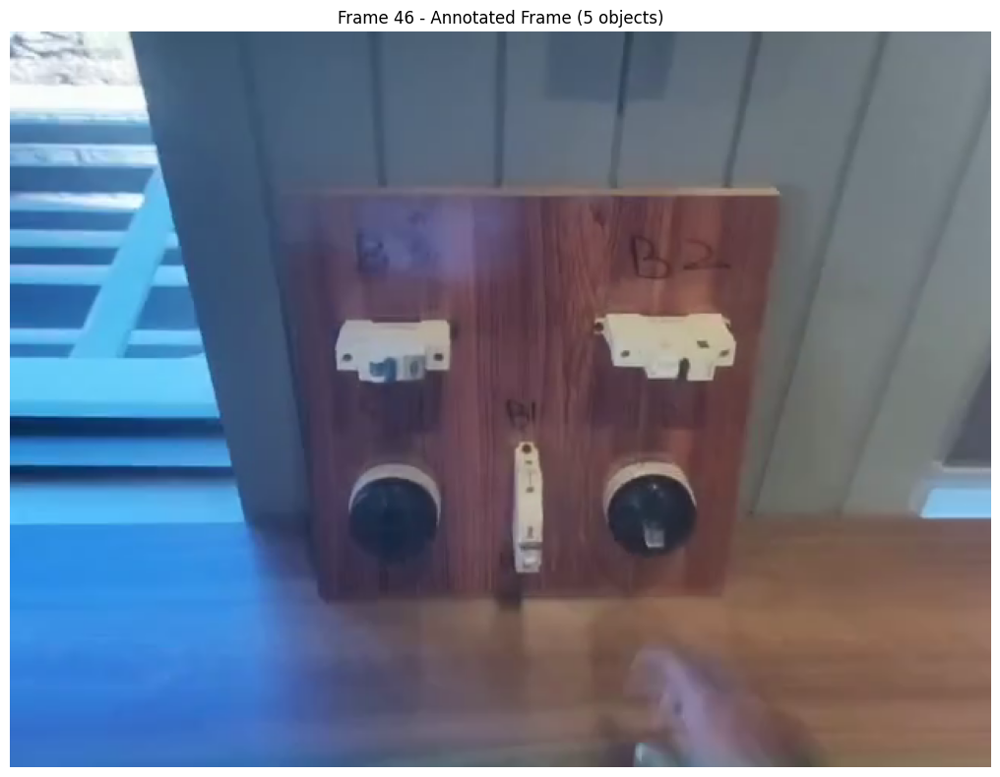


✓ Frame 46 loaded as starting frame
  Remaining frames to process: 2365
  Frame shape: (480, 640, 3)


In [8]:
import json

# ============= AUTO-DETECT ANNOTATED FRAME FROM JSON =============

print(f"\nLoading annotations from: {os.path.basename(ANNOTATION_FILE)}")

# Load JSON annotations
with open(ANNOTATION_FILE, "r") as f:
    data = json.load(f)

# Find the first frame that has bounding boxes defined AND exists in the video
START_FRAME = None
num_boxes = 0
all_annotated_frames = []

for i, frame in enumerate(data["frames"]):
    annotation = frame.get("annotation", {})
    boxes = annotation.get("boxes", [])
    
    if len(boxes) > 0:
        
        frame_no = i
        print(frame)
        all_annotated_frames.append(frame_no)
        
        # Check if this frame exists in the actual video
        if 0 <= frame_no < total_frames:
            if START_FRAME is None:  # Take the first valid one
                START_FRAME = frame_no
                num_boxes = len(boxes)
                print(f"✓ Found annotated frame: {START_FRAME}")
                print(f"  Number of bounding boxes: {num_boxes}")

if START_FRAME is None:
    print(f"\n❌ ERROR: No valid annotated frames found!")
    print(f"  Video has {total_frames} frames (0-{total_frames-1})")
    print(f"  JSON contains {len(all_annotated_frames)} annotated frames: {all_annotated_frames[:10]}...")
    print(f"\n  This suggests the JSON was created for a different video.")
    print(f"  Please verify you have the correct JSON file for this video:")
    print(f"    Video: {os.path.basename(VIDEO_PATH)}")
    print(f"    JSON:  {os.path.basename(ANNOTATION_FILE)}")
    raise ValueError(f"No annotated frames within video range (0-{total_frames-1}) found in {ANNOTATION_FILE}")

# Load the annotated frame
print(f"\nLoading frame {START_FRAME}...")
cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME)
ret, first_frame = cap.read()

if not ret:
    raise ValueError(f"Cannot read frame {START_FRAME}")

# Convert BGR to RGB for display
first_frame_rgb = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)

# Display the annotated frame
plt.figure(figsize=(12, 8))
plt.imshow(first_frame_rgb)
plt.title(f"Frame {START_FRAME} - Annotated Frame ({num_boxes} objects)")
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"\n✓ Frame {START_FRAME} loaded as starting frame")
print(f"  Remaining frames to process: {total_frames - START_FRAME}")
print(f"  Frame shape: {first_frame_rgb.shape}")


## 7. Initialize Predictor with Annotated Frame

Load the annotated frame into the predictor and initialize the memory bank.


In [9]:
# Use the auto-detected annotated frame as the first frame for the predictor
frame_rgb = first_frame_rgb

# Initialize predictor with the annotated frame
print(f"Initializing predictor with frame {START_FRAME}...")
predictor.load_first_frame(frame_rgb)
print(f"✓ Frame {START_FRAME} loaded into predictor as first frame")


Initializing predictor with frame 46...


W0127 16:54:39.739000 85244 site-packages/torch/_inductor/utils.py:1613] [0/0] Not enough SMs to use max_autotune_gemm mode
Autotune Choices Stats:
{"num_choices": 2, "num_triton_choices": 0, "best_kernel": "bias_addmm", "best_time": 0.023552000522613525}
AUTOTUNE addmm(1024x256, 1024x384, 384x256)
strides: [0, 1], [384, 1], [1, 384]
dtypes: torch.bfloat16, torch.bfloat16, torch.bfloat16
  bias_addmm 0.0236 ms 100.0% 
  addmm 0.0256 ms 92.0% 
SingleProcess AUTOTUNE benchmarking takes 0.0753 seconds and 0.0002 seconds precompiling for 2 choices
Autotune Choices Stats:
{"num_choices": 2, "num_triton_choices": 0, "best_kernel": "bias_addmm", "best_time": 0.07065600156784058}
AUTOTUNE addmm(16384x288, 16384x96, 96x288)
strides: [0, 1], [96, 1], [1, 96]
dtypes: torch.bfloat16, torch.bfloat16, torch.bfloat16
  bias_addmm 0.0707 ms 100.0% 
  addmm 0.1188 ms 59.5% 
SingleProcess AUTOTUNE benchmarking takes 0.0291 seconds and 0.0001 seconds precompiling for 2 choices
Autotune Choices Stats:
{"n

✓ Frame 46 loaded into predictor as first frame


## 8. Add Initial Prompts for Objects

Define the objects you want to track by adding prompts.

**Important**: 
- Each object needs a unique `obj_id` (any integer)
- Coordinates are in original video resolution
- You can add multiple objects by repeating the prompt addition

In [10]:
# ============= LOAD BOUNDING BOXES FROM JSON (USING JSON INDEX) =============

print(f"\nExtracting bounding boxes from JSON index {START_FRAME}...")

def box_from_normalized(points, w, h):
    """
    Convert normalized coordinates (0–1) to pixel coordinates.
    """
    xs = [p["x"] for p in points.values()]
    ys = [p["y"] for p in points.values()]

    x_min = int(min(xs) * w)
    x_max = int(max(xs) * w)
    y_min = int(min(ys) * h)
    y_max = int(max(ys) * h)

    return np.array([x_min, y_min, x_max, y_max], dtype=np.float32)


# ------------------------------------------------------------------
# Get annotated frame directly by JSON index
# ------------------------------------------------------------------
if START_FRAME < 0 or START_FRAME >= len(data["frames"]):
    raise IndexError(
        f"START_FRAME {START_FRAME} out of bounds for JSON frames list"
    )

frame_entry = data["frames"][START_FRAME]
annotation = frame_entry.get("annotation", {})
boxes_data = annotation.get("boxes", [])

if len(boxes_data) == 0:
    raise ValueError(
        f"JSON index {START_FRAME} has no bounding boxes"
    )

print(f"✓ JSON index {START_FRAME} contains {len(boxes_data)} boxes")
print(f"  Corresponding video frameNo: {frame_entry['frameNo']}")


# ------------------------------------------------------------------
# Convert boxes to pixel coordinates
# ------------------------------------------------------------------
boxes = []
obj_id = 1

for box_data in boxes_data:
    pixel_box = box_from_normalized(
        box_data["coordinates"],
        width,
        height,
    )
    boxes.append((obj_id, pixel_box))

    print(
        f"  ✓ Object {obj_id} bbox (px): "
        f"{pixel_box.astype(int).tolist()}"
    )

    obj_id += 1

print(f"\n✓ Loaded {len(boxes)} bounding boxes from JSON index {START_FRAME}")


# ============= ADD PROMPTS TO SAM2 =============

print(f"\nAdding prompts to SAM2 predictor...")

for obj_id, box in boxes:
    x1, y1, x2, y2 = box

    center_point = np.array(
        [[(x1 + x2) / 2.0, (y1 + y2) / 2.0]],
        dtype=np.float32
    )

    labels = np.array([1], dtype=np.int32)  # positive click

    _, out_obj_ids, out_mask_logits = predictor.add_new_prompt(
        frame_idx=0,        # first frame in SAM2 memory
        obj_id=obj_id,
        points=center_point,
        labels=labels,
        bbox=box,
    )

    print(
        f"  ✓ Added object {obj_id} | "
        f"bbox={box.astype(int).tolist()} | "
        f"total objects now={len(out_obj_ids)}"
    )

print("\n✓ All prompts added successfully!")
print(f"  Total objects tracked: {len(out_obj_ids)}")
print(
    f"  Object IDs: "
    f"{out_obj_ids.tolist() if hasattr(out_obj_ids, 'tolist') else out_obj_ids}"
)
print(f"  Final mask tensor shape: {out_mask_logits.shape}")



Extracting bounding boxes from JSON index 46...
✓ JSON index 46 contains 5 boxes
  Corresponding video frameNo: 47
  ✓ Object 1 bbox (px): [373, 177, 477, 232]
  ✓ Object 2 bbox (px): [202, 180, 296, 235]
  ✓ Object 3 bbox (px): [319, 262, 353, 359]
  ✓ Object 4 bbox (px): [382, 275, 450, 345]
  ✓ Object 5 bbox (px): [215, 277, 284, 349]

✓ Loaded 5 bounding boxes from JSON index 46

Adding prompts to SAM2 predictor...
  ✓ Added object 1 | bbox=[373, 177, 477, 232] | total objects now=1
  ✓ Added object 2 | bbox=[202, 180, 296, 235] | total objects now=2
  ✓ Added object 3 | bbox=[319, 262, 353, 359] | total objects now=3
  ✓ Added object 4 | bbox=[382, 275, 450, 345] | total objects now=4
  ✓ Added object 5 | bbox=[215, 277, 284, 349] | total objects now=5

✓ All prompts added successfully!
  Total objects tracked: 5
  Object IDs: [1, 2, 3, 4, 5]
  Final mask tensor shape: torch.Size([5, 1, 480, 640])


## 9. Visualize Initial Segmentation

Display the segmentation masks on the first frame to verify prompts are correct.

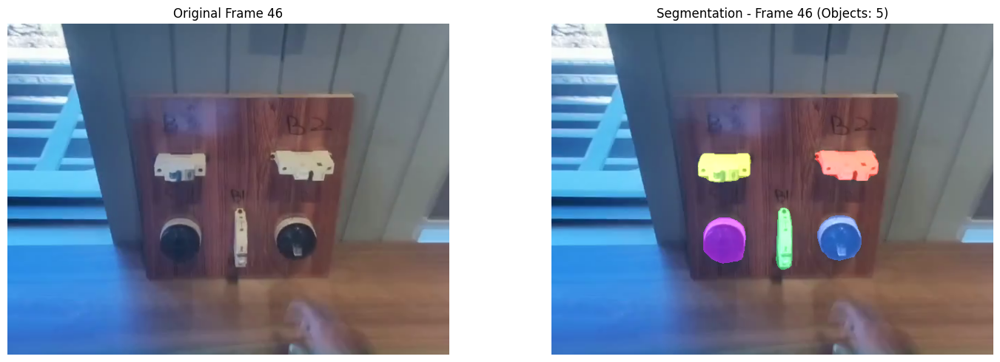

✓ Initial segmentation on frame 46 looks good!
✓ Proceed to next cell to process remaining frames!


In [11]:
def visualize_masks(frame, mask_logits, obj_ids, alpha=0.5):
    """
    Overlay segmentation masks on frame with different colors per object.
    
    Args:
        frame: RGB image (H, W, 3)
        mask_logits: Tensor of mask logits (N, 1, H, W)
        obj_ids: Tensor of object IDs
        alpha: Transparency of overlay (0=transparent, 1=opaque)
    """
    height, width = frame.shape[:2]
    
    # Create colored overlay
    overlay = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Generate different colors for each object
    for i, obj_id in enumerate(obj_ids):
        # Extract mask and convert to numpy
        mask = (mask_logits[i] > 0.0).squeeze().cpu().numpy()
        
        # Generate color (HSV for better color separation)
        hue = (i * 180 // len(obj_ids)) % 180
        color_hsv = np.uint8([[[hue, 255, 255]]])
        color_rgb = cv2.cvtColor(color_hsv, cv2.COLOR_HSV2RGB)[0, 0]
        
        # Apply color to mask region
        overlay[mask] = color_rgb
    
    # Blend with original frame
    result = cv2.addWeighted(frame, 1.0, overlay, alpha, 0)
    
    return result

# Visualize the annotated frame segmentation
result_frame = visualize_masks(first_frame_rgb, out_mask_logits, out_obj_ids)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(first_frame_rgb)
plt.title(f"Original Frame {START_FRAME}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_frame)
plt.title(f"Segmentation - Frame {START_FRAME} (Objects: {len(out_obj_ids)})")
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"✓ Initial segmentation on frame {START_FRAME} looks good!")
print("✓ Proceed to next cell to process remaining frames!")


## 10. Process All Video Frames

Process the entire video frame by frame using the streaming approach.

**Memory Management**:
- Frames are processed sequentially (not all loaded at once)
- Only maintains memory bank of recent frames (~7 frames)
- Significantly reduces memory usage compared to original SAM2

**Optional Features**:
- Add correction prompts mid-video if tracking drifts
- Save individual masks or overlay video

In [ ]:
raw_video_dir = os.path.join(OUTPUT_DIR, "raw_video")
overlay_dir = os.path.join(OUTPUT_DIR, "mask_overlay")
masks_dir = os.path.join(OUTPUT_DIR, "masks")

os.makedirs(raw_video_dir, exist_ok=True)
os.makedirs(overlay_dir, exist_ok=True)
os.makedirs(masks_dir, exist_ok=True)

raw_video_path = os.path.join(
    raw_video_dir, f"raw_trimmed_{START_FRAME}_{total_frames}.mp4"
)
overlay_video_path = os.path.join(
    overlay_dir, f"mask_overlay_{START_FRAME}_{total_frames}.mp4"
)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

raw_video_writer = cv2.VideoWriter(
    raw_video_path, fourcc, fps, (width, height)
)

overlay_video_writer = cv2.VideoWriter(
    overlay_video_path, fourcc, fps, (width, height)
)

print("✓ Output writers initialized")
print(f"Raw trimmed video   → {raw_video_path}")
print(f"Mask overlay video  → {overlay_video_path}")
print(f"Raw masks directory → {masks_dir}")


✓ Output writers initialized
Raw trimmed video   → task_694b8738c03ba603fd33296d_export/raw_video/raw_trimmed_336_1821.mp4
Mask overlay video  → task_694b8738c03ba603fd33296d_export/mask_overlay/mask_overlay_336_1821.mp4
Raw masks directory → task_694b8738c03ba603fd33296d_export/masks


In [ ]:
print("FPS from video:", fps)

if fps is None or fps <= 0:
    raise ValueError(f"Invalid FPS detected: {fps}")


FPS from video: 20.0


In [ ]:
cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME)
ret, test_frame = cap.read()
assert ret, "Failed to read test frame"

height, width = test_frame.shape[:2]


In [ ]:
# ----------------------------
# FPS
# ----------------------------
fps = cap.get(cv2.CAP_PROP_FPS)
if fps <= 0:
    fps = 25
    print("⚠ FPS invalid, using fallback 25")

# ----------------------------
# Frame size (ground truth)
# ----------------------------
cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME)
ret, test_frame = cap.read()
assert ret, "Failed to read frame for size detection"

height, width = test_frame.shape[:2]

cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

# ----------------------------
# Video writers (USE ONE CODEC)
# ----------------------------
fourcc = cv2.VideoWriter_fourcc(*"XVID")

overlay_video_writer = cv2.VideoWriter(
    overlay_video_path.replace(".mp4", ".avi"),
    fourcc, fps, (width, height)
)

segmented_area_writer = cv2.VideoWriter(
    os.path.join(
        OUTPUT_DIR, f"segmented_area_{START_FRAME}_{total_frames}.avi"
    ),
    fourcc, fps, (width, height)
)

assert overlay_video_writer.isOpened(), "Overlay writer failed"
assert segmented_area_writer.isOpened(), "Segmented writer failed"

print("✓ Video writers initialized correctly")


✓ Video writers initialized correctly


In [ ]:
# # --------------------------------------------------
# # Per-object segmented-area-only writers
# # --------------------------------------------------
# segmented_obj_writers = {}

# fourcc = cv2.VideoWriter_fourcc(*"XVID")

# for obj_id in out_obj_ids:
#     obj_id_val = int(obj_id) if not isinstance(obj_id, int) else obj_id

#     video_path = os.path.join(
#         OUTPUT_DIR, f"segmented_object_{obj_id_val}.avi"
#     )

#     writer = cv2.VideoWriter(
#         video_path, fourcc, fps, (width, height)
#     )

#     assert writer.isOpened(), f"Failed to open writer for object {obj_id_val}"

#     segmented_obj_writers[obj_id_val] = writer
#     print(f"✓ Saving segmented-area-only video for object {obj_id_val} → {video_path}")


In [ ]:
CROP_SIZE = 128
fourcc = cv2.VideoWriter_fourcc(*"XVID")

segmented_obj_writers = {}

for obj_id in out_obj_ids:
    obj_id_val = int(obj_id)

    path = os.path.join(
        OUTPUT_DIR, f"segmented_object_{obj_id_val}_centered.avi"
    )

    writer = cv2.VideoWriter(
        path, fourcc, fps, (CROP_SIZE, CROP_SIZE)
    )

    assert writer.isOpened(), f"Writer failed for object {obj_id_val}"
    segmented_obj_writers[obj_id_val] = writer


In [ ]:
def crop_centered(frame_rgb, mask, crop_size):
    """
    Crop a fixed-size window centered on the mask centroid.
    Pads with black if crop goes out of bounds.
    """
    h, w = frame_rgb.shape[:2]
    half = crop_size // 2

    # Compute centroid of mask
    ys, xs = np.where(mask)
    if len(xs) == 0:
        # No mask found → return black frame
        return np.zeros((crop_size, crop_size, 3), dtype=np.uint8)

    cx = int(xs.mean())
    cy = int(ys.mean())

    # Define crop bounds
    x1 = cx - half
    x2 = cx + half
    y1 = cy - half
    y2 = cy + half

    # Create black canvas
    crop = np.zeros((crop_size, crop_size, 3), dtype=np.uint8)

    # Compute valid region inside original frame
    src_x1 = max(0, x1)
    src_y1 = max(0, y1)
    src_x2 = min(w, x2)
    src_y2 = min(h, y2)

    # Corresponding region in crop
    dst_x1 = src_x1 - x1
    dst_y1 = src_y1 - y1
    dst_x2 = dst_x1 + (src_x2 - src_x1)
    dst_y2 = dst_y1 + (src_y2 - src_y1)

    crop[dst_y1:dst_y2, dst_x1:dst_x2] = frame_rgb[src_y1:src_y2, src_x1:src_x2]

    return crop


In [ ]:
def draw_frame_number(
    img,
    frame_no,
    pos=(10, 30),
    scale=0.8,
    thickness=2,
    color=(255, 255, 255)
):
    """
    Draw frame number on image (RGB).
    """
    cv2.putText(
        img,
        f"Frame: {frame_no}",
        pos,
        cv2.FONT_HERSHEY_SIMPLEX,
        scale,
        color,
        thickness,
        cv2.LINE_AA
    )


In [ ]:
print(f"\nProcessing TRIMMED frames {START_FRAME + 1} to {total_frames}...\n")

cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):

    for frame_idx in tqdm(
        range(START_FRAME + 1, total_frames),
        desc="Processing trimmed frames"
    ):

        ret, frame_bgr = cap.read()
        if not ret:
            break

        frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

        # ----------------------------
        # Track objects
        # ----------------------------
        out_obj_ids, out_mask_logits = predictor.track(frame_rgb)

        # ==================================================
        # 1. COMBINED SEGMENTED AREA (ALL OBJECTS)
        # ==================================================
        combined_mask = np.zeros((height, width), dtype=bool)
        for i in range(len(out_obj_ids)):
            combined_mask |= (
                out_mask_logits[i] > 0.0
            ).squeeze().cpu().numpy()

        segmented_rgb = np.zeros_like(frame_rgb)
        segmented_rgb[combined_mask] = frame_rgb[combined_mask]

        # ---- draw frame number ----
        draw_frame_number(segmented_rgb, frame_idx)
        # ---------------------------

        segmented_area_writer.write(
            cv2.cvtColor(segmented_rgb, cv2.COLOR_RGB2BGR)
        )

        # ==================================================
        # 2. PER-OBJECT CENTERED SEGMENTED VIDEOS
        # ==================================================
        for i, obj_id in enumerate(out_obj_ids):
            obj_id_val = int(obj_id)

            mask = (
                out_mask_logits[i] > 0.0
            ).squeeze().cpu().numpy()

            centered_crop_rgb = crop_centered(
                frame_rgb,
                mask,
                crop_size=CROP_SIZE
            )

            # ---- draw frame number ----
            draw_frame_number(
                centered_crop_rgb,
                frame_idx,               # change here for relative numbering
                pos=(5, 20),
                scale=0.6
            )
            # ---------------------------

            segmented_obj_writers[obj_id_val].write(
                cv2.cvtColor(centered_crop_rgb, cv2.COLOR_RGB2BGR)
            )

        # ==================================================
        # 3. OVERLAY VIDEO
        # ==================================================
        overlay_rgb = visualize_masks(
            frame_rgb,
            out_mask_logits,
            out_obj_ids,
            alpha=0.5
        )

        # ---- draw frame number ----
        draw_frame_number(overlay_rgb, frame_idx)
        # ---------------------------

        overlay_video_writer.write(
            cv2.cvtColor(overlay_rgb, cv2.COLOR_RGB2BGR)
        )



Processing TRIMMED frames 337 to 1821...



Processing trimmed frames: 100%|██████████| 1484/1484 [01:04<00:00, 23.01it/s]


In [ ]:
# print(f"\nProcessing TRIMMED frames {START_FRAME + 1} to {total_frames}...\n")

# # Move video reader to first frame after annotation
# cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):

#     for frame_idx in tqdm(
#         range(START_FRAME + 1, total_frames),
#         desc="Processing trimmed frames"
#     ):

#         # --------------------------------------------------
#         # Read frame
#         # --------------------------------------------------
#         ret, frame_bgr = cap.read()
#         if not ret:
#             break

#         frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

#         # --------------------------------------------------
#         # Track objects (SAM2 streaming)
#         # --------------------------------------------------
#         out_obj_ids, out_mask_logits = predictor.track(frame_rgb)

#         # --------------------------------------------------
#         # 1. COMBINED SEGMENTED AREA (ALL OBJECTS)
#         # --------------------------------------------------
#         combined_mask = np.zeros((height, width), dtype=bool)

#         for i in range(len(out_obj_ids)):
#             combined_mask |= (
#                 out_mask_logits[i] > 0.0
#             ).squeeze().cpu().numpy()

#         segmented_rgb = np.zeros_like(frame_rgb)
#         segmented_rgb[combined_mask] = frame_rgb[combined_mask]

#         segmented_area_writer.write(
#             cv2.cvtColor(segmented_rgb, cv2.COLOR_RGB2BGR)
#         )

#         # --------------------------------------------------
#         # 2. PER-OBJECT CENTERED SEGMENTED VIDEOS
#         # --------------------------------------------------
#         for i, obj_id in enumerate(out_obj_ids):
#             obj_id_val = int(obj_id)

#             mask = (
#                 out_mask_logits[i] > 0.0
#             ).squeeze().cpu().numpy()

#             centered_crop_rgb = crop_centered(
#                 frame_rgb,
#                 mask,
#                 crop_size=CROP_SIZE
#             )

#             segmented_obj_writers[obj_id_val].write(
#                 cv2.cvtColor(centered_crop_rgb, cv2.COLOR_RGB2BGR)
#             )

#         # --------------------------------------------------
#         # 3. OVERLAY VIDEO (DEBUG / VISUALIZATION)
#         # --------------------------------------------------
#         overlay_rgb = visualize_masks(
#             frame_rgb,
#             out_mask_logits,
#             out_obj_ids,
#             alpha=0.5
#         )

#         overlay_video_writer.write(
#             cv2.cvtColor(overlay_rgb, cv2.COLOR_RGB2BGR)
#         )



Processing TRIMMED frames 534 to 3414...



Processing trimmed frames:   4%|▍         | 125/2880 [00:05<02:01, 22.75it/s]


KeyboardInterrupt: 

In [ ]:
# print(f"\nProcessing TRIMMED frames {START_FRAME + 1} to {total_frames}...\n")

# cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):

#     for frame_idx in tqdm(
#         range(START_FRAME + 1, total_frames),
#         desc="Processing trimmed frames"
#     ):

#         ret, frame_bgr = cap.read()
#         if not ret:
#             break

#         frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

#         # ----------------------------
#         # Track objects
#         # ----------------------------
#         out_obj_ids, out_mask_logits = predictor.track(frame_rgb)

#         # ----------------------------
#         # SEGMENTED AREA ONLY
#         # ----------------------------
#         combined_mask = np.zeros((height, width), dtype=bool)

#         for i in range(len(out_obj_ids)):
#             combined_mask |= (
#                 out_mask_logits[i] > 0.0
#             ).squeeze().cpu().numpy()

#         segmented_rgb = np.zeros_like(frame_rgb)
#         segmented_rgb[combined_mask] = frame_rgb[combined_mask]

#         segmented_area_writer.write(
#             cv2.cvtColor(segmented_rgb, cv2.COLOR_RGB2BGR)
#         )


#         # ----------------------------
#         # SEGMENTED AREA ONLY — PER OBJECT
#         # ----------------------------
#         for i, obj_id in enumerate(out_obj_ids):
#             obj_id_val = int(obj_id) if not isinstance(obj_id, int) else obj_id

#             mask = (out_mask_logits[i] > 0.0).squeeze().cpu().numpy()

#             segmented_rgb = np.zeros_like(frame_rgb)
#             segmented_rgb[mask] = frame_rgb[mask]

#             segmented_obj_writers[obj_id_val].write(
#                 cv2.cvtColor(segmented_rgb, cv2.COLOR_RGB2BGR)
#             )


#         # ----------------------------
#         # OVERLAY VIDEO
#         # ----------------------------
#         overlay_rgb = visualize_masks(
#             frame_rgb, out_mask_logits, out_obj_ids, alpha=0.5
#         )

#         overlay_video_writer.write(
#             cv2.cvtColor(overlay_rgb, cv2.COLOR_RGB2BGR)
#         )



Processing TRIMMED frames 534 to 3414...



Processing trimmed frames:   0%|          | 0/2880 [00:00<?, ?it/s][ WARN:0@17487.575] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.577] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.578] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.580] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.581] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.625] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.626] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.627] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.629] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.630] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.674] global cap_ffmpeg.cpp:198 write FFmpeg: Failed to write frame
[ WARN:0@17487.675] global cap_

In [ ]:
# # Write a single overlay frame safely (raw is copied, not re-encoded)
# import numpy as np

# # Remove raw re-encode; raw video should be copied via shutil.copy2
# # Guard overlay writer writes and validate image type
# if SAVE_OVERLAY_VIDEO and overlay_video_writer is not None:
#     if isinstance(overlay_frame_bgr, np.ndarray):
#         overlay_video_writer.write(overlay_frame_bgr)
#         print("\u2713 Wrote overlay frame")
#     else:
#         print("\u26a0 overlay_frame_bgr is not a numpy array; skipping")
# else:
#     print("\u2139 Overlay writer not initialized or saving disabled")

✓ Wrote overlay frame


In [ ]:
# # --------------------------------------------------
# # SEGMENTED AREA ONLY VIDEO (RAW RGB, NO MASK VISUALS)
# # --------------------------------------------------
# segmented_area_path = os.path.join(
#     OUTPUT_DIR, f"segmented_area_{START_FRAME}_{total_frames}.mp4"
# )

# fourcc = cv2.VideoWriter_fourcc(*"mp4v")
# segmented_area_writer = cv2.VideoWriter(
#     segmented_area_path, fourcc, fps, (width, height)
# )

# assert segmented_area_writer.isOpened(), "Failed to open segmented-area writer"
# print(f"Saving segmented-area-only video to: {segmented_area_path}")


Saving segmented-area-only video to: task_694b8738c03ba603fd33296b_export/segmented_area_533_3414.mp4



Processing TRIMMED frames 534 to 3414...



Processing trimmed frames:   2%|▏         | 65/2880 [00:03<02:02, 22.92it/s]

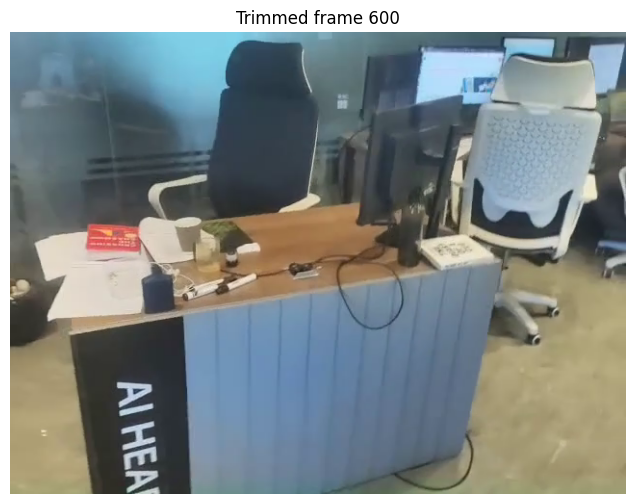

Processing trimmed frames:   6%|▌         | 164/2880 [00:07<01:58, 22.99it/s]

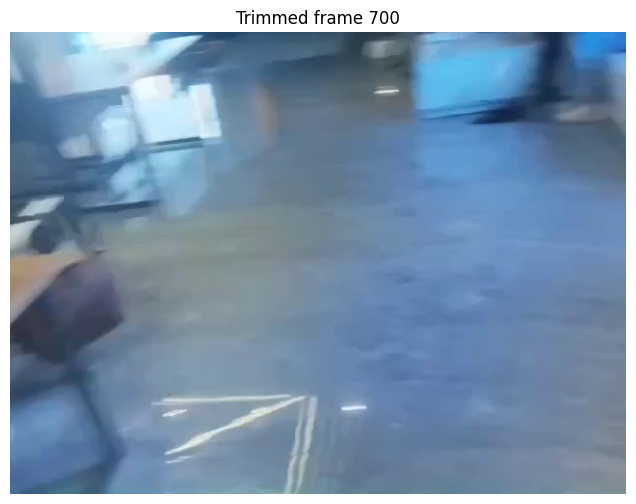

Processing trimmed frames:   9%|▉         | 266/2880 [00:12<02:03, 21.19it/s]

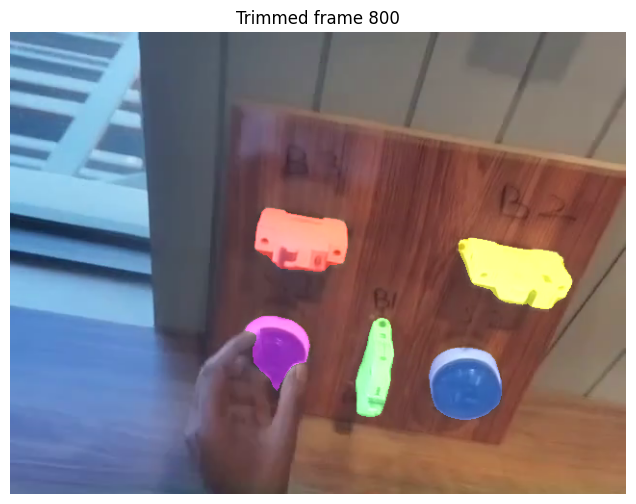

Processing trimmed frames:  13%|█▎        | 365/2880 [00:16<01:50, 22.81it/s]

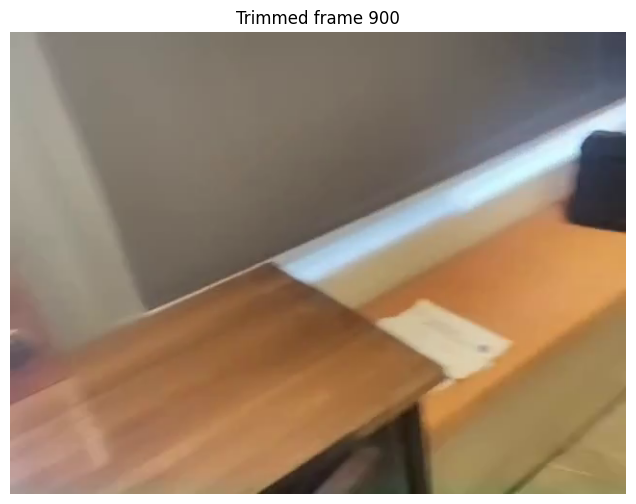

Processing trimmed frames:  16%|█▌        | 464/2880 [00:21<01:46, 22.66it/s]

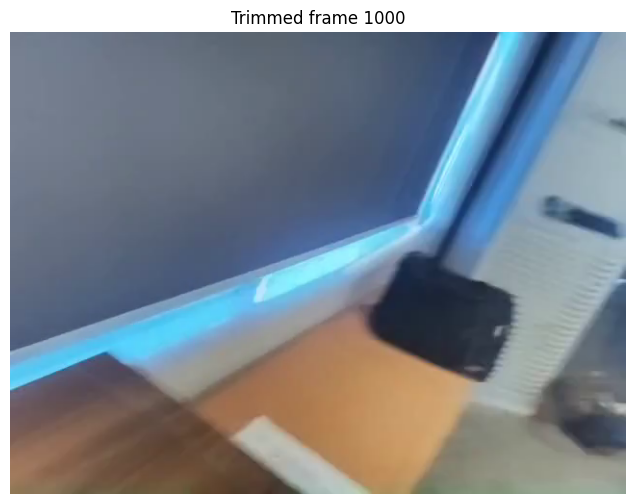

Processing trimmed frames:  20%|█▉        | 566/2880 [00:26<01:42, 22.57it/s]

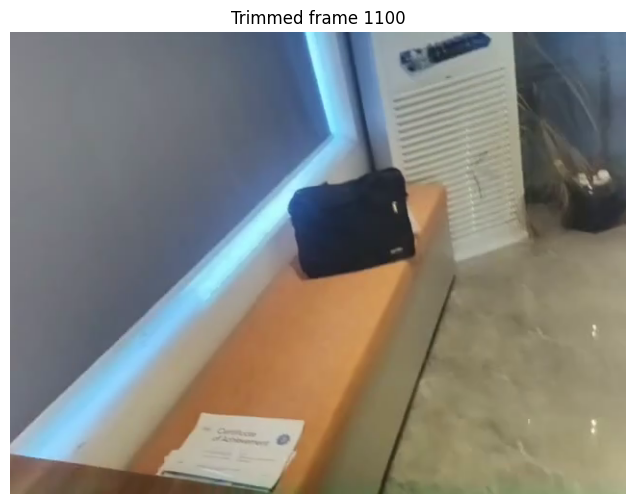

Processing trimmed frames:  23%|██▎       | 665/2880 [00:30<01:35, 23.16it/s]

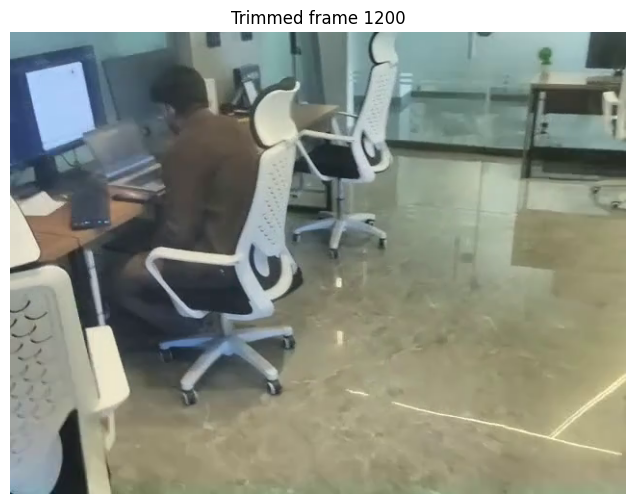

Processing trimmed frames:  27%|██▋       | 764/2880 [00:35<01:30, 23.30it/s]

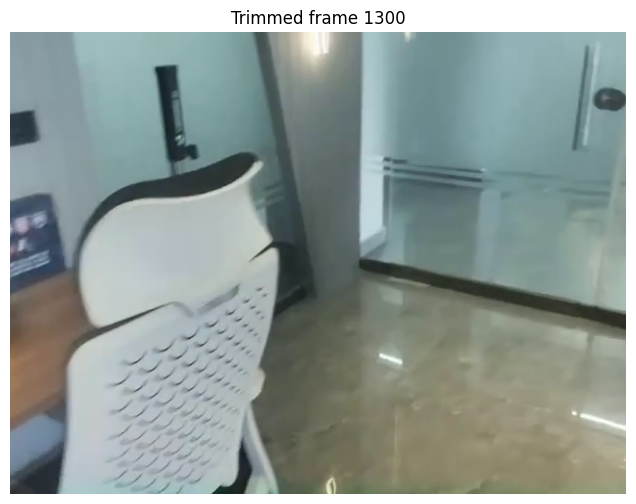

Processing trimmed frames:  30%|███       | 866/2880 [00:39<01:28, 22.63it/s]

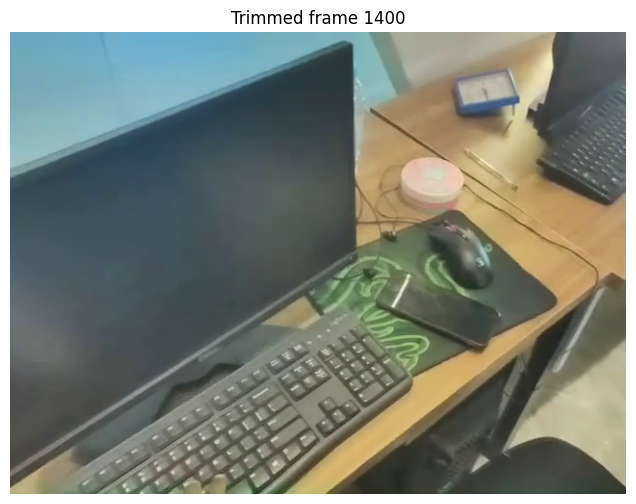

Processing trimmed frames:  33%|███▎      | 964/2880 [00:44<01:25, 22.41it/s]

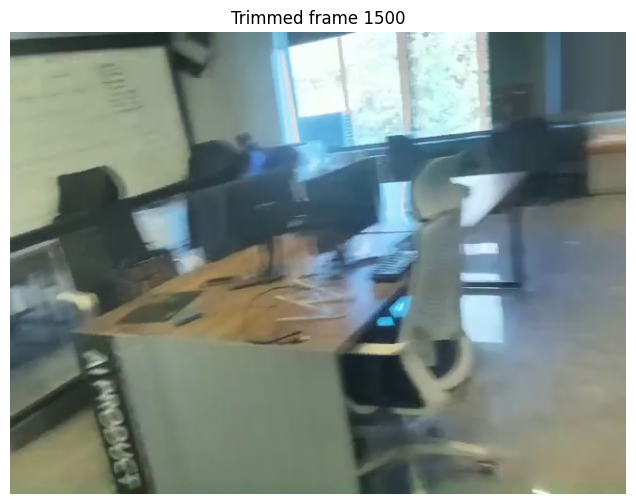

Processing trimmed frames:  37%|███▋      | 1066/2880 [00:48<01:20, 22.56it/s]

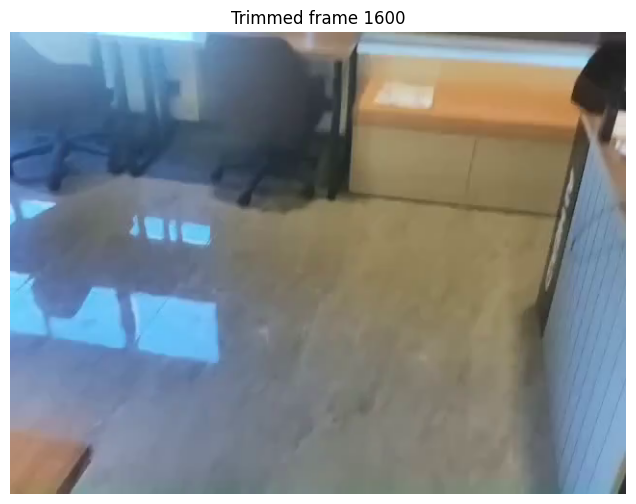

Processing trimmed frames:  40%|████      | 1164/2880 [00:53<01:20, 21.40it/s]

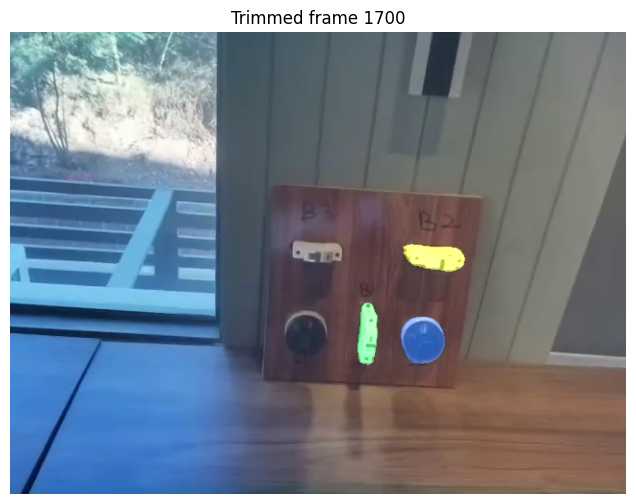

Processing trimmed frames:  44%|████▍     | 1266/2880 [00:58<01:11, 22.51it/s]

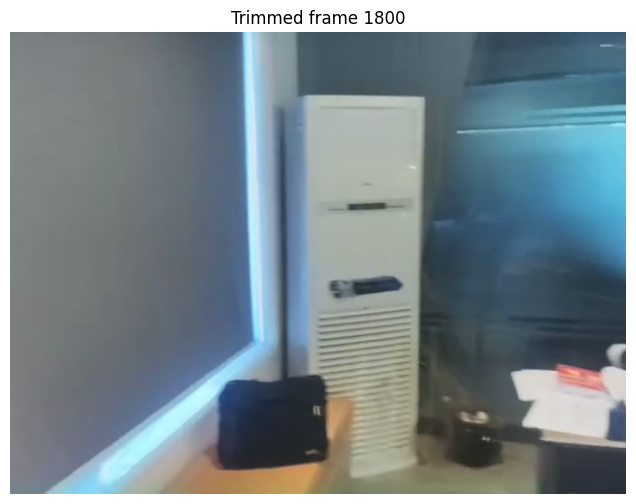

Processing trimmed frames:  47%|████▋     | 1366/2880 [01:02<01:06, 22.78it/s]

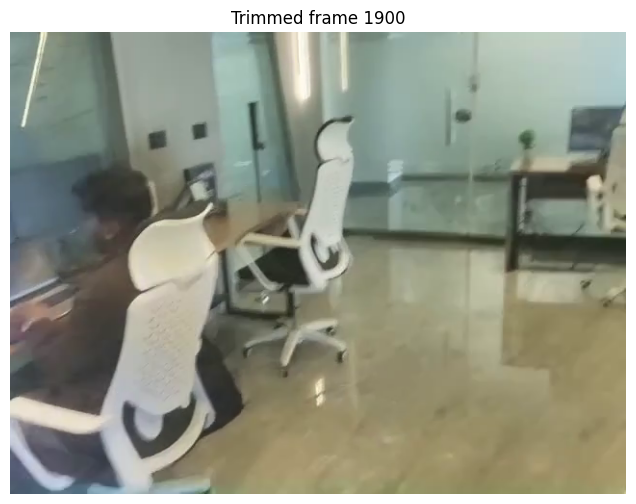

Processing trimmed frames:  51%|█████     | 1464/2880 [01:07<01:03, 22.45it/s]

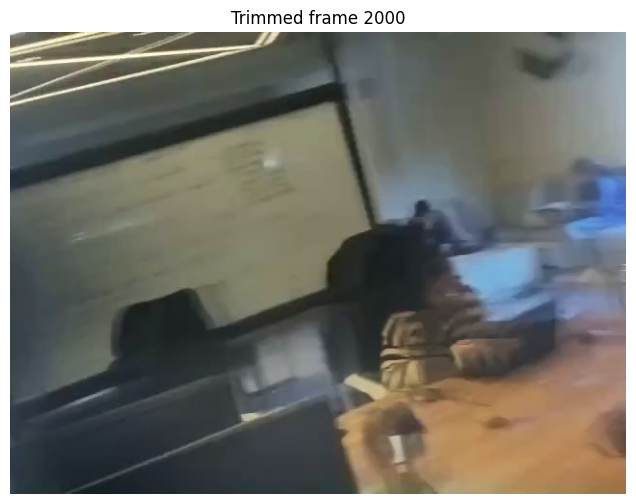

Processing trimmed frames:  54%|█████▍    | 1566/2880 [01:11<00:58, 22.61it/s]

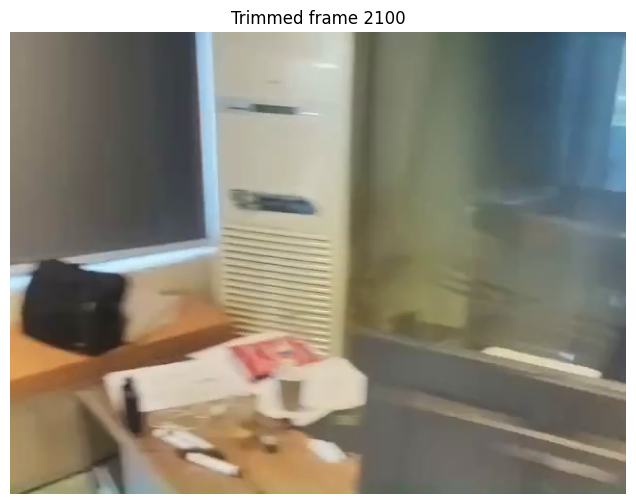

Processing trimmed frames:  58%|█████▊    | 1665/2880 [01:16<00:55, 22.00it/s]

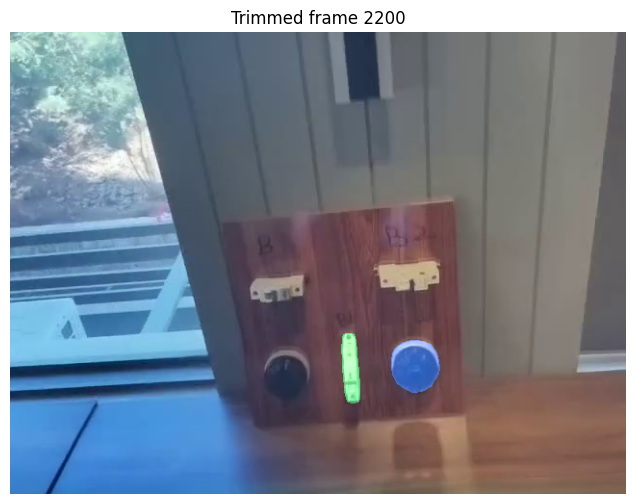

Processing trimmed frames:  61%|██████▏   | 1766/2880 [01:21<00:48, 22.86it/s]

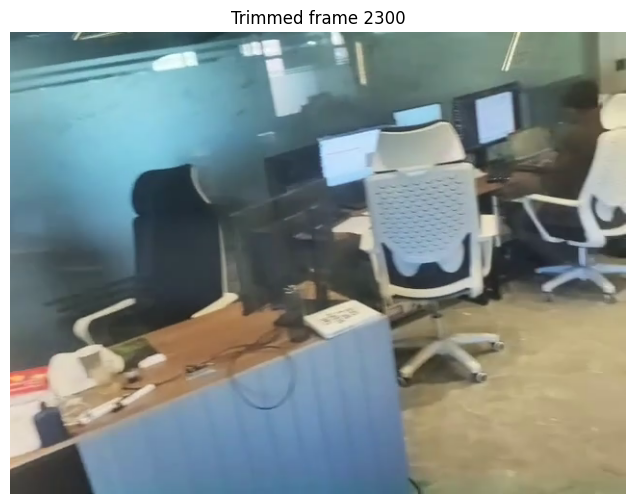

Processing trimmed frames:  65%|██████▍   | 1866/2880 [01:25<00:43, 23.24it/s]

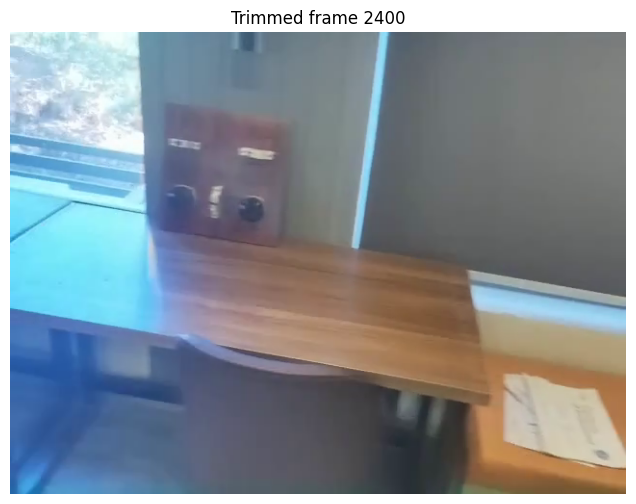

Processing trimmed frames:  68%|██████▊   | 1966/2880 [01:30<00:43, 21.06it/s]

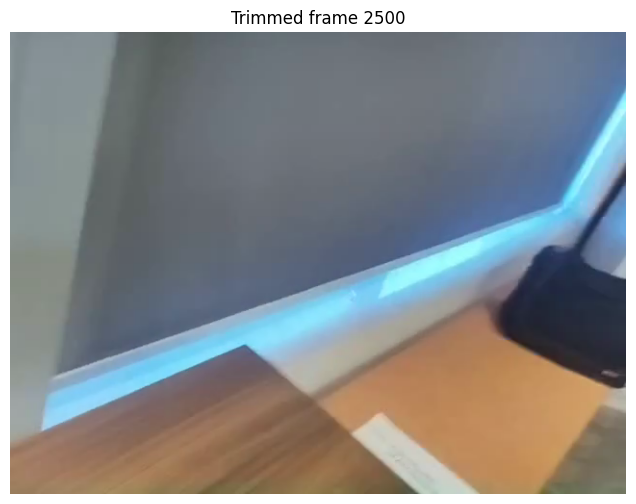

Processing trimmed frames:  72%|███████▏  | 2064/2880 [01:35<00:38, 21.04it/s]

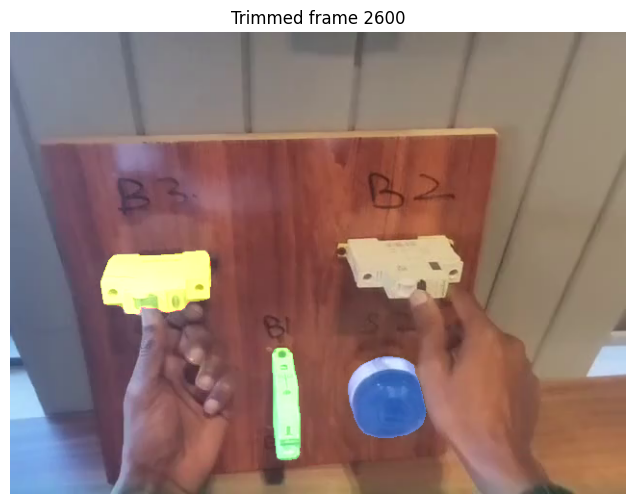

Processing trimmed frames:  75%|███████▌  | 2164/2880 [01:39<00:31, 22.72it/s]

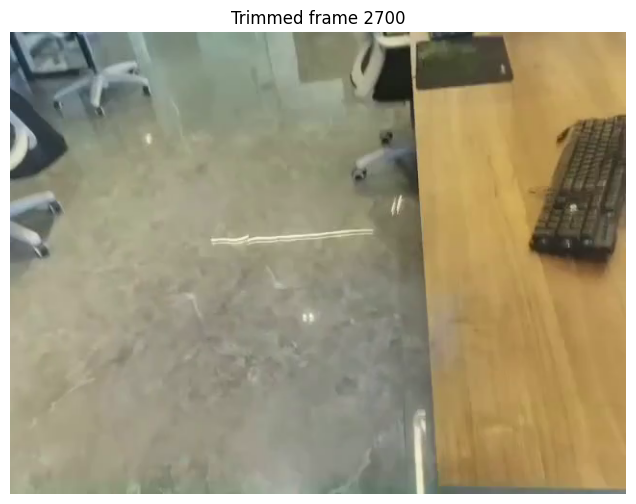

Processing trimmed frames:  79%|███████▊  | 2265/2880 [01:44<00:27, 22.59it/s]

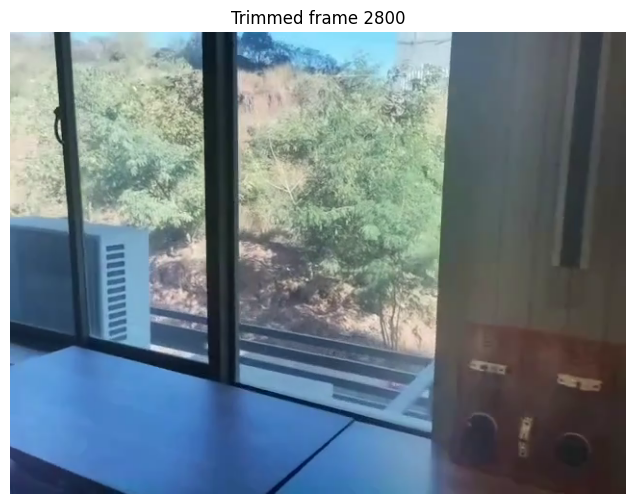

Processing trimmed frames:  82%|████████▏ | 2365/2880 [01:49<00:24, 21.08it/s]

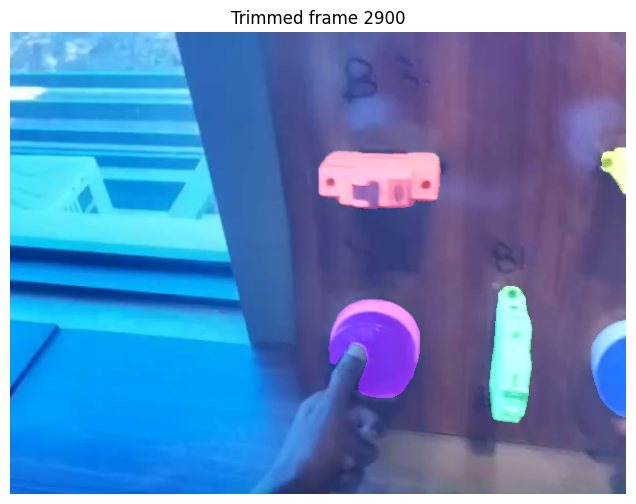

Processing trimmed frames:  86%|████████▌ | 2464/2880 [01:54<00:18, 22.75it/s]

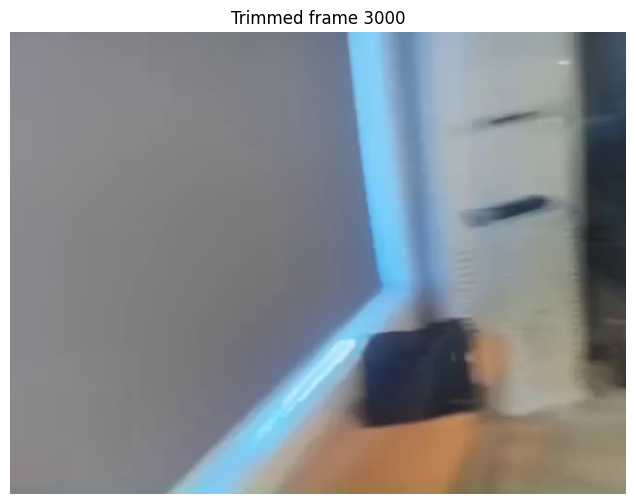

Processing trimmed frames:  89%|████████▉ | 2566/2880 [01:58<00:13, 23.23it/s]

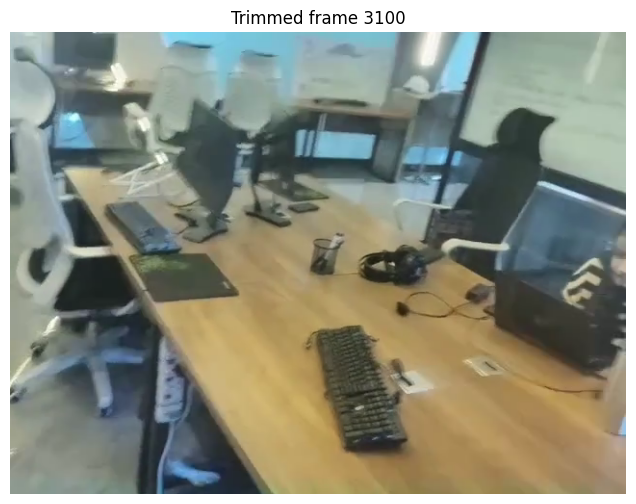

Processing trimmed frames:  93%|█████████▎| 2665/2880 [02:03<00:09, 21.84it/s]

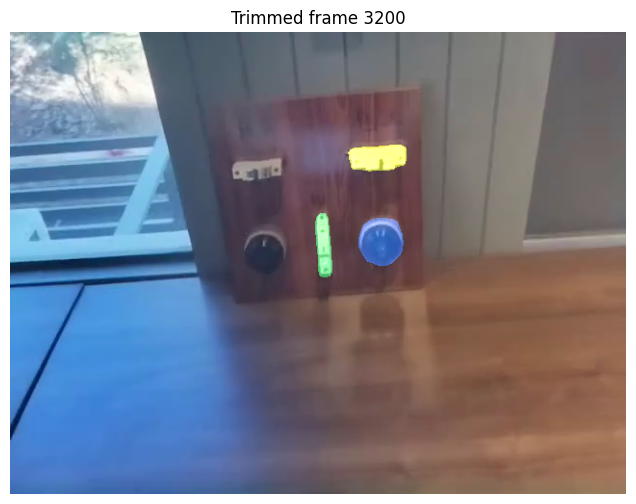

Processing trimmed frames:  96%|█████████▌| 2765/2880 [02:07<00:04, 23.27it/s]

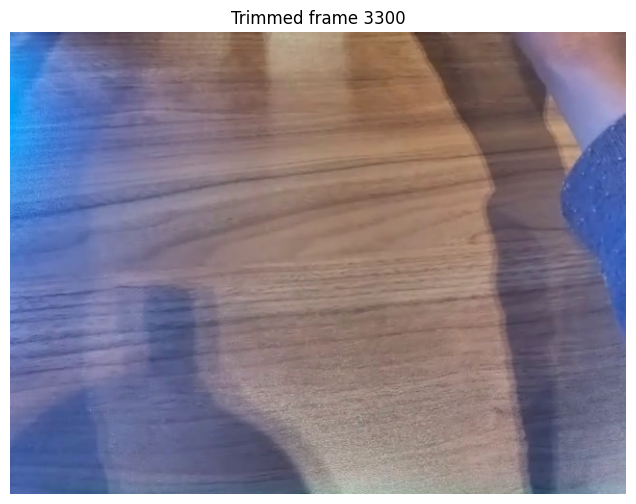

Processing trimmed frames: 100%|█████████▉| 2866/2880 [02:12<00:00, 22.92it/s]

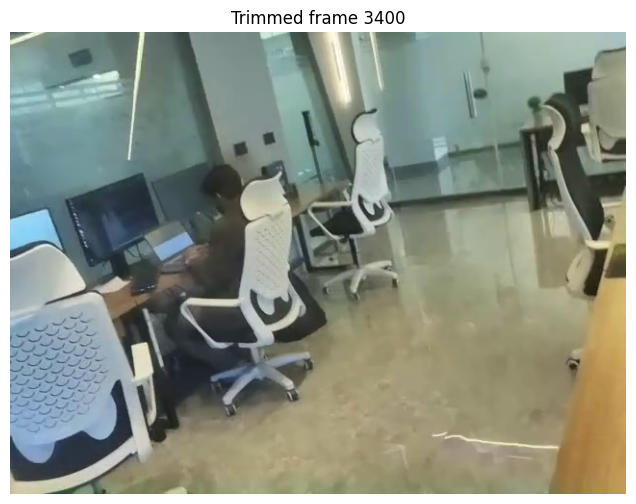

Processing trimmed frames: 100%|██████████| 2880/2880 [02:13<00:00, 21.58it/s]


In [ ]:
# print(f"\nProcessing TRIMMED frames {START_FRAME + 1} to {total_frames}...\n")

# cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):

#     for frame_idx in tqdm(
#         range(START_FRAME + 1, total_frames),
#         desc="Processing trimmed frames"
#     ):

#         # --------------------------------------------------
#         # Read frame
#         # --------------------------------------------------
#         ret, frame_bgr = cap.read()
#         if not ret:
#             print(f"Warning: Could not read frame {frame_idx}")
#             break

#         # --------------------------------------------------
#         # 1. Save RAW trimmed video
#         # --------------------------------------------------
#         raw_video_writer.write(frame_bgr)

#         frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

#         # --------------------------------------------------
#         # 2. Track objects with SAM2
#         # --------------------------------------------------
#         out_obj_ids, out_mask_logits = predictor.track(frame_rgb)

#         # --------------------------------------------------
#         # 3. SEGMENTED AREA ONLY (raw RGB pixels, no masks)
#         # --------------------------------------------------
#         combined_mask = np.zeros((height, width), dtype=bool)

#         for i in range(len(out_obj_ids)):
#             mask = (out_mask_logits[i] > 0.0).squeeze().cpu().numpy()
#             combined_mask |= mask

#         segmented_rgb = np.zeros_like(frame_rgb)
#         segmented_rgb[combined_mask] = frame_rgb[combined_mask]

#         segmented_area_writer.write(
#             cv2.cvtColor(segmented_rgb, cv2.COLOR_RGB2BGR)
#         )

#         # --------------------------------------------------
#         # 4. Save RAW MASKS (PNG per object, optional)
#         # --------------------------------------------------
#         if SAVE_MASKS:
#             for i, obj_id in enumerate(out_obj_ids):
#                 mask = (
#                     (out_mask_logits[i] > 0.0)
#                     .squeeze()
#                     .cpu()
#                     .numpy()
#                     .astype(np.uint8)
#                     * 255
#                 )

#                 obj_id_val = int(obj_id) if not isinstance(obj_id, int) else obj_id
#                 mask_path = os.path.join(
#                     masks_dir, f"frame_{frame_idx:06d}_obj_{obj_id_val}.png"
#                 )
#                 cv2.imwrite(mask_path, mask)

#         # --------------------------------------------------
#         # 5. MASK OVERLAY video (for visualization)
#         # --------------------------------------------------
#         overlay_rgb = visualize_masks(
#             frame_rgb, out_mask_logits, out_obj_ids, alpha=0.5
#         )
#         overlay_video_writer.write(
#             cv2.cvtColor(overlay_rgb, cv2.COLOR_RGB2BGR)
#         )

#         # --------------------------------------------------
#         # 6. Optional preview
#         # --------------------------------------------------
#         if frame_idx % VISUALIZATION_INTERVAL == 0:
#             plt.figure(figsize=(10, 6))
#             plt.imshow(overlay_rgb)
#             plt.title(f"Trimmed frame {frame_idx}")
#             plt.axis("off")
#             plt.show()
#             plt.close("all")



Processing TRIMMED frames 613 to 2158...



Processing trimmed frames:   6%|▌         | 86/1545 [00:03<01:03, 23.09it/s]

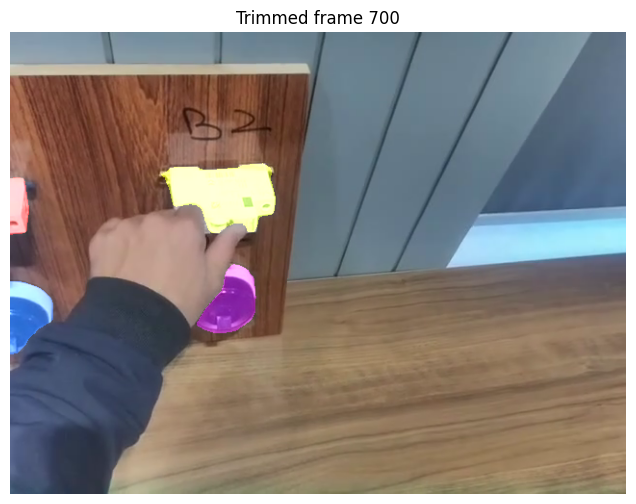

Processing trimmed frames:  12%|█▏        | 185/1545 [00:08<01:00, 22.51it/s]

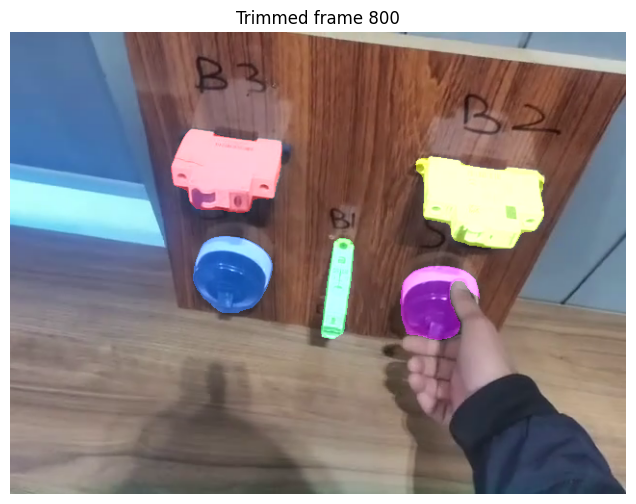

Processing trimmed frames:  19%|█▊        | 287/1545 [00:12<00:53, 23.39it/s]

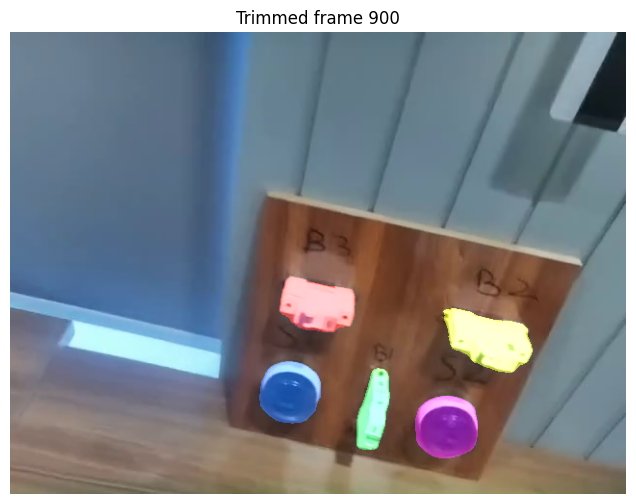

Processing trimmed frames:  25%|██▍       | 386/1545 [00:17<00:46, 25.11it/s]

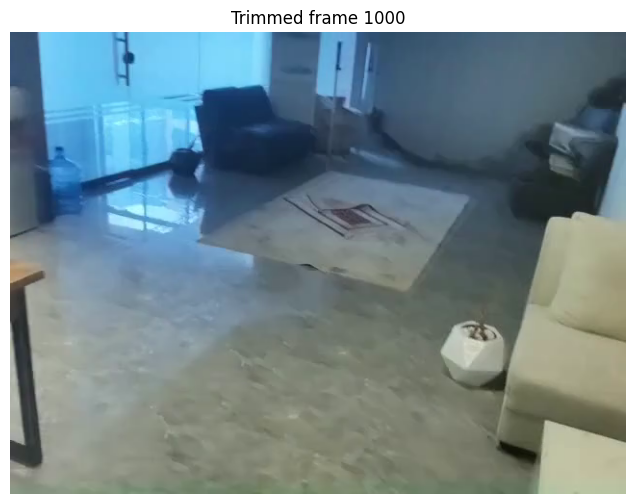

Processing trimmed frames:  31%|███▏      | 485/1545 [00:21<00:43, 24.56it/s]

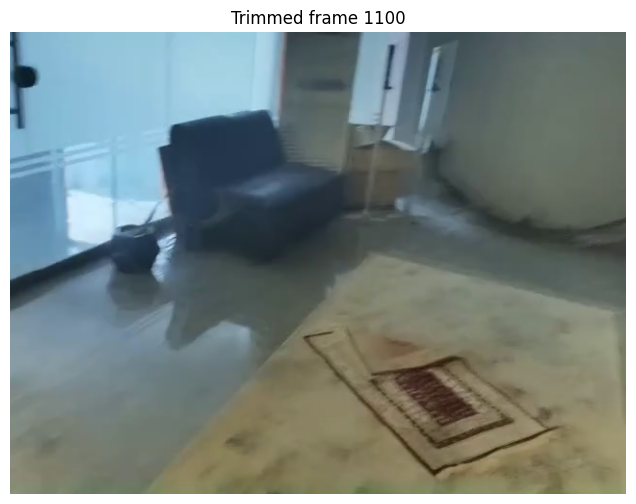

Processing trimmed frames:  38%|███▊      | 587/1545 [00:25<00:39, 24.05it/s]

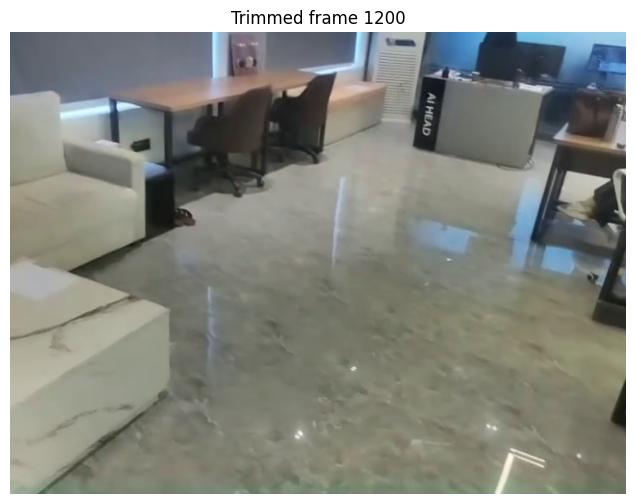

Processing trimmed frames:  44%|████▍     | 686/1545 [00:29<00:35, 24.05it/s]

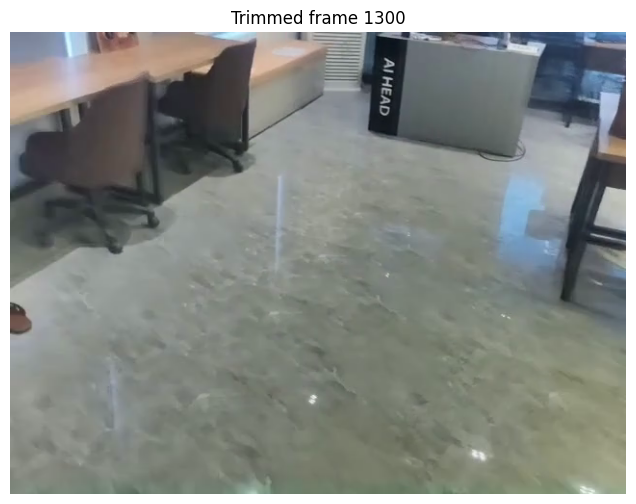

Processing trimmed frames:  51%|█████     | 785/1545 [00:33<00:31, 23.89it/s]

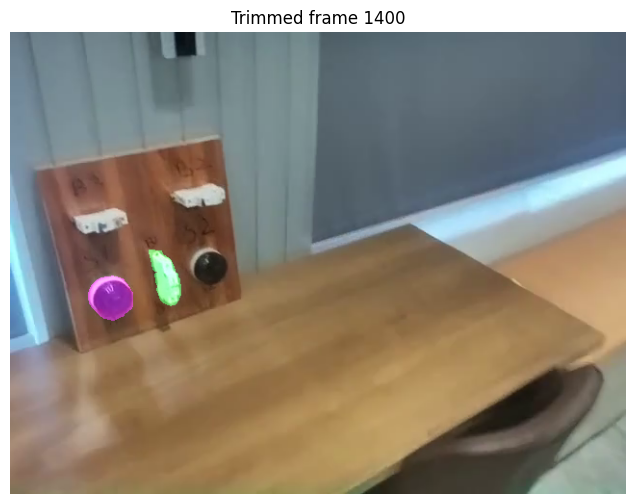

Processing trimmed frames:  57%|█████▋    | 887/1545 [00:38<00:29, 22.50it/s]

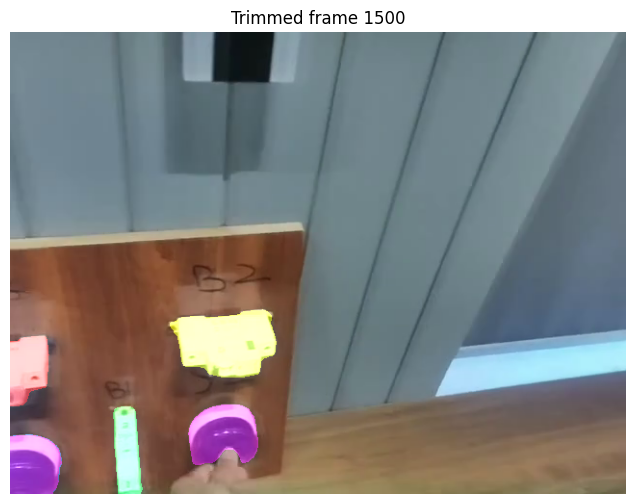

Processing trimmed frames:  64%|██████▍   | 985/1545 [00:42<00:24, 22.77it/s]

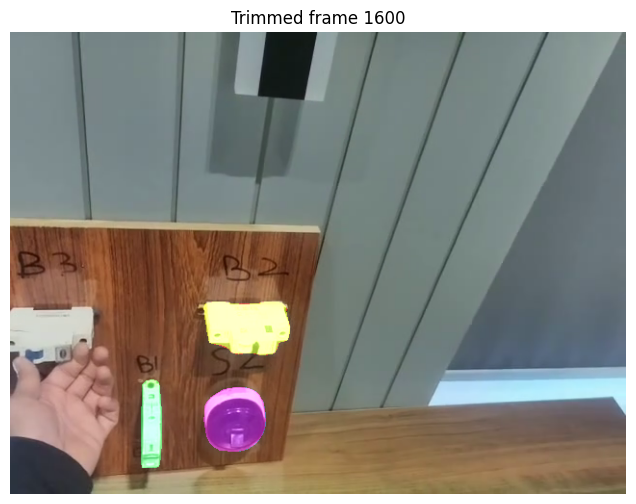

Processing trimmed frames:  70%|███████   | 1087/1545 [00:47<00:19, 23.76it/s]

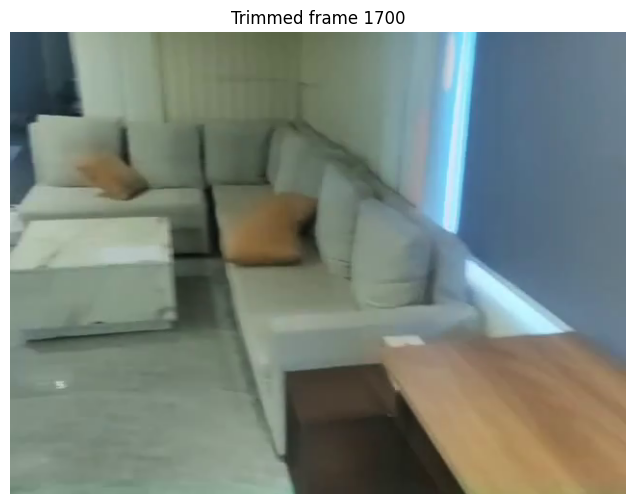

Processing trimmed frames:  77%|███████▋  | 1186/1545 [00:51<00:15, 23.69it/s]

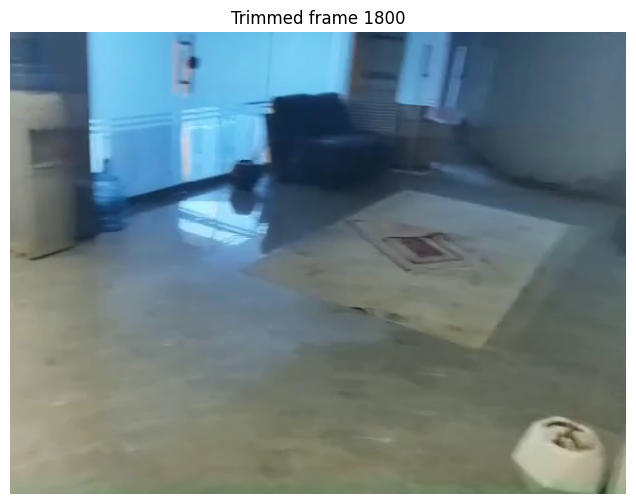

Processing trimmed frames:  83%|████████▎ | 1285/1545 [00:56<00:10, 24.19it/s]

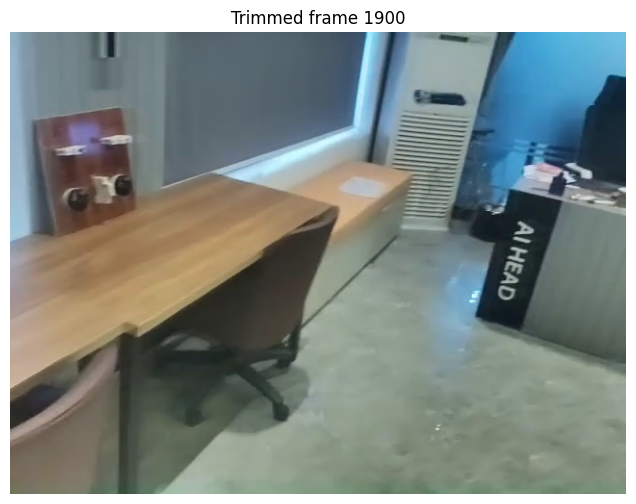

Processing trimmed frames:  90%|████████▉ | 1387/1545 [01:00<00:06, 22.85it/s]

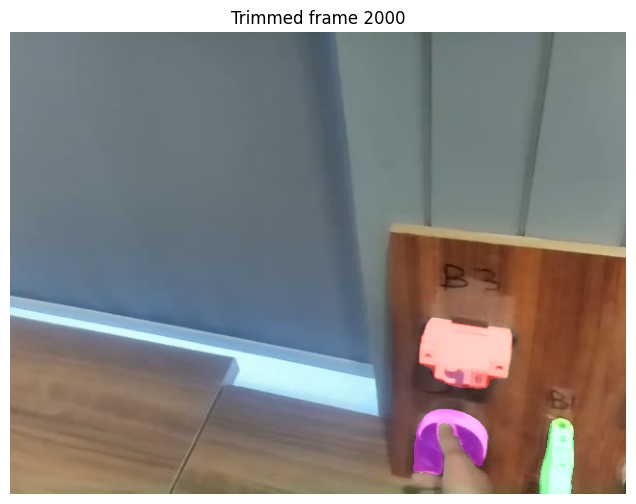

Processing trimmed frames:  96%|█████████▌| 1485/1545 [01:04<00:02, 23.28it/s]

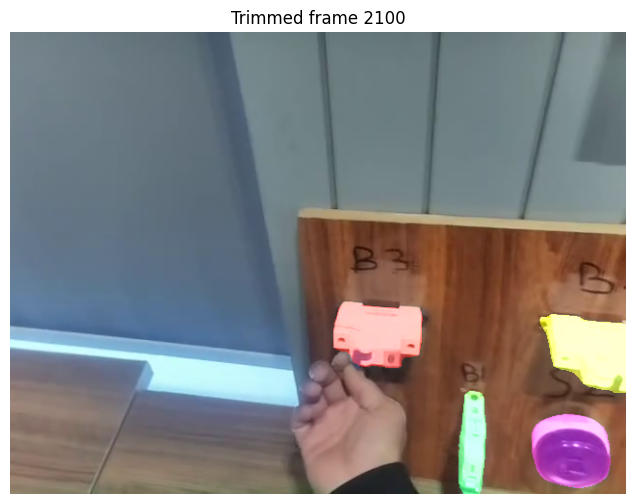

Processing trimmed frames: 100%|██████████| 1545/1545 [01:07<00:00, 22.86it/s]


In [ ]:
# print(f"\nProcessing TRIMMED frames {START_FRAME + 1} to {total_frames}...\n")

# cap.set(cv2.CAP_PROP_POS_FRAMES, START_FRAME + 1)

# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
#     for local_idx, frame_idx in enumerate(
#         tqdm(range(START_FRAME + 1, total_frames), desc="Processing trimmed frames")
#     ):

#         ret, frame = cap.read()
#         if not ret:
#             print(f"Warning: Could not read frame {frame_idx}")
#             break

#         # --------------------------------------------------
#         # 1. RAW VIDEO (TRIMMED ONLY)
#         # --------------------------------------------------
#         raw_video_writer.write(frame)

#         frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#         # --------------------------------------------------
#         # 2. Object tracking
#         # --------------------------------------------------
#         out_obj_ids, out_mask_logits = predictor.track(frame_rgb)

#         # --------------------------------------------------
#         # 3. RAW MASKS (trimmed frame index preserved)
#         # --------------------------------------------------
#         for i, obj_id in enumerate(out_obj_ids):
#             mask = (
#                 (out_mask_logits[i] > 0.0)
#                 .squeeze()
#                 .cpu()
#                 .numpy()
#                 .astype(np.uint8)
#                 * 255
#             )

#             obj_id_val = obj_id if isinstance(obj_id, int) else obj_id.item()

#             mask_path = os.path.join(
#                 masks_dir, f"frame_{frame_idx:06d}_obj_{obj_id_val}.png"
#             )
#             cv2.imwrite(mask_path, mask)

#         # --------------------------------------------------
#         # 4. MASK OVERLAY (same trimmed frames)
#         # --------------------------------------------------
#         overlay_frame = visualize_masks(
#             frame_rgb, out_mask_logits, out_obj_ids, alpha=0.5
#         )
#         overlay_frame_bgr = cv2.cvtColor(overlay_frame, cv2.COLOR_RGB2BGR)
#         overlay_video_writer.write(overlay_frame_bgr)

#         # --------------------------------------------------
#         # 5. Optional visualization
#         # --------------------------------------------------
#         if frame_idx % VISUALIZATION_INTERVAL == 0:
#             plt.figure(figsize=(10, 6))
#             plt.imshow(overlay_frame)
#             plt.title(f"Trimmed frame {frame_idx}")
#             plt.axis("off")
#             plt.show()
#             plt.close("all")


In [ ]:
# cap.release()
# raw_video_writer.release()
# overlay_video_writer.release()

# print("\n✓ Trimmed video processing complete!")
# print(f"Frames processed: {START_FRAME + 1} → {total_frames}")
# print(f"Output directory: {OUTPUT_DIR}")



✓ Trimmed video processing complete!
Frames processed: 534 → 3414
Output directory: task_694b8738c03ba603fd33296b_export


In [ ]:
# import cv2
# import os
# import re
# import random
# import numpy as np
# from tqdm import tqdm

# # ----------------------------
# # Paths (derived, NOT hardcoded)
# # ----------------------------
# MASKS_DIR = os.path.join(OUTPUT_DIR, "masks")
# OUTPUT_VIDEO = os.path.join(OUTPUT_DIR, "masks_colored.avi")

# assert os.path.isdir(MASKS_DIR), f"Missing masks directory: {MASKS_DIR}"

# # ----------------------------
# # Params
# # ----------------------------
# FPS = int(cap.get(cv2.CAP_PROP_FPS))
# if FPS <= 0:
#     FPS = 25

# FOURCC = cv2.VideoWriter_fourcc(*"XVID")

# # ----------------------------
# # Get frame size from first mask
# # ----------------------------
# mask_files = sorted([f for f in os.listdir(MASKS_DIR) if f.endswith(".png")])
# assert len(mask_files) > 0, "No mask files found"

# first_mask = cv2.imread(
#     os.path.join(MASKS_DIR, mask_files[0]),
#     cv2.IMREAD_GRAYSCALE
# )
# height, width = first_mask.shape

# # ----------------------------
# # Group masks by frame
# # ----------------------------
# frame_dict = {}
# frame_pattern = re.compile(r"frame_(\d+)_obj_(\d+)\.png")

# for fname in mask_files:
#     m = frame_pattern.match(fname)
#     if m:
#         frame_idx = int(m.group(1))
#         frame_dict.setdefault(frame_idx, []).append(fname)

# frame_indices = sorted(frame_dict.keys())

# # ----------------------------
# # Assign colors per object
# # ----------------------------
# object_colors = {}

# def get_color(obj_id):
#     if obj_id not in object_colors:
#         object_colors[obj_id] = [
#             random.randint(50, 255),
#             random.randint(50, 255),
#             random.randint(50, 255),
#         ]
#     return object_colors[obj_id]

# # ----------------------------
# # Video writer
# # ----------------------------
# writer = cv2.VideoWriter(
#     OUTPUT_VIDEO, FOURCC, FPS, (width, height), isColor=True
# )
# assert writer.isOpened(), "Failed to open colored mask writer"

# # ----------------------------
# # Build video
# # ----------------------------
# for frame_idx in tqdm(frame_indices, desc="Building colored mask video"):
#     canvas = np.zeros((height, width, 3), dtype=np.uint8)

#     for fname in frame_dict[frame_idx]:
#         m = frame_pattern.match(fname)
#         obj_id = int(m.group(2))

#         mask = cv2.imread(
#             os.path.join(MASKS_DIR, fname),
#             cv2.IMREAD_GRAYSCALE,
#         )

#         canvas[mask > 0] = get_color(obj_id)

#     writer.write(canvas)

# writer.release()

# print(f"✓ Colored mask video saved to: {OUTPUT_VIDEO}")


AssertionError: No mask files found

## 10.5 Save Raw Video Cropped to Segmented Area

Create a raw video that only includes the region covered by the segmentation masks (plus a small padding). This reuses the saved mask PNGs to find per-frame bounding boxes, crops the original video to those boxes, pads to a fixed size, and writes a new video.

## 11. Memory Usage Statistics

Check GPU memory usage after processing.

In [ ]:
# if torch.cuda.is_available():
#     memory_allocated = torch.cuda.memory_allocated() / 1e9
#     memory_reserved = torch.cuda.memory_reserved() / 1e9
#     max_memory_allocated = torch.cuda.max_memory_allocated() / 1e9
    
#     print("GPU Memory Usage:")
#     print(f"  Currently allocated: {memory_allocated:.2f} GB")
#     print(f"  Currently reserved: {memory_reserved:.2f} GB")
#     print(f"  Peak allocated: {max_memory_allocated:.2f} GB")
#     print(f"\nℹ For comparison, loading all {total_frames} frames would need ~{estimated_memory_gb:.2f} GB")
#     print(f"  SAM2 streaming approach saves {estimated_memory_gb - max_memory_allocated:.2f} GB!")

## 12. Additional Tips for Memory Optimization

If you're still experiencing memory issues with 2000+ frames:

### 1. Use Smaller Model
```python
MODEL_CFG = "configs/sam2.1/sam2.1_hiera_t_512.yaml"  # 512x512 resolution
```

### 2. Process in Batches
Instead of processing all 2000 frames at once, process in segments:
- Frames 0-1000
- Frames 1001-2000
Then merge results.

### 3. Reduce Memory Bank Size
Modify the config YAML to reduce `num_maskmem` from 7 to 3-4.

### 4. Don't Save Everything
```python
SAVE_MASKS = False  # Save only final video, not individual masks
```

### 5. Enable CPU Offloading
If you modify the predictor initialization, you can enable:
```python
predictor.condition_state['offload_state_to_cpu'] = True
```
(This will slow down inference but save GPU memory)

### 6. Process at Lower Resolution
Resize input frames before processing:
```python
frame_resized = cv2.resize(frame, (frame.shape[1]//2, frame.shape[0]//2))
```

## Summary

This notebook demonstrated how to:
1. ✓ Load SAM2 real-time predictor with memory-efficient settings
2. ✓ Process 2000+ frame videos without loading all frames into memory
3. ✓ Add multiple object prompts (points, bounding boxes)
4. ✓ Track objects across all frames sequentially
5. ✓ Save results (masks and overlay video)
6. ✓ Monitor memory usage

**Key Advantage**: The streaming approach processes frames one at a time, maintaining only a small memory bank, which allows processing of arbitrarily long videos that would cause OOM errors in the original SAM2 implementation.

**Model Recommendation**: For 2000+ frames with limited memory, use `sam2.1_hiera_t_512.yaml` (Tiny model at 512x512 resolution).